In [25]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 
import plotly.express as px
import streamlit as st

In [26]:
df = pd.read_csv("train.csv")
df.head(4)

,Unnamed: 0,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,...,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,...,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied
2,2,110028,Female,Loyal Customer,26,Business travel,Business,1142,2,2,...,5,4,3,4,4,4,5,0,0.0,satisfied
3,3,24026,Female,Loyal Customer,25,Business travel,Business,562,2,5,...,2,2,5,3,1,4,2,11,9.0,neutral or dissatisfied


In [27]:
df.tail(4)

,Unnamed: 0,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
103900,103900,73097,Male,Loyal Customer,49,Business travel,Business,2347,4,4,...,5,5,5,5,5,5,4,0,0.0,satisfied
103901,103901,68825,Male,disloyal Customer,30,Business travel,Business,1995,1,1,...,4,3,2,4,5,5,4,7,14.0,neutral or dissatisfied
103902,103902,54173,Female,disloyal Customer,22,Business travel,Eco,1000,1,1,...,1,4,5,1,5,4,1,0,0.0,neutral or dissatisfied
103903,103903,62567,Male,Loyal Customer,27,Business travel,Business,1723,1,3,...,1,1,1,4,4,3,1,0,0.0,neutral or dissatisfied


**Exploring and reformating data**

In [28]:
print("Our data set consists of",df.shape[0],"lines and", df.shape[1],"columns")

Our data set consists of 103904 lines and 25 columns


In [29]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103904 entries, 0 to 103903
Data columns (total 25 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Unnamed: 0                         103904 non-null  int64  
 1   id                                 103904 non-null  int64  
 2   Gender                             103904 non-null  object 
 3   Customer Type                      103904 non-null  object 
 4   Age                                103904 non-null  int64  
 5   Type of Travel                     103904 non-null  object 
 6   Class                              103904 non-null  object 
 7   Flight Distance                    103904 non-null  int64  
 8   Inflight wifi service              103904 non-null  int64  
 9   Departure/Arrival time convenient  103904 non-null  int64  
 10  Ease of Online booking             103904 non-null  int64  
 11  Gate location                      1039

1. The column "Arrival Delay in Minutes" has 137 missinf values. So we need to deleate such lines.
2. Also first two colums are useless and we can get rid of them.

In [30]:
df = df.drop(df.columns[[0,1]],axis=1)
df.dropna(subset="Arrival Delay in Minutes",inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 103594 entries, 0 to 103903
Data columns (total 23 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Gender                             103594 non-null  object 
 1   Customer Type                      103594 non-null  object 
 2   Age                                103594 non-null  int64  
 3   Type of Travel                     103594 non-null  object 
 4   Class                              103594 non-null  object 
 5   Flight Distance                    103594 non-null  int64  
 6   Inflight wifi service              103594 non-null  int64  
 7   Departure/Arrival time convenient  103594 non-null  int64  
 8   Ease of Online booking             103594 non-null  int64  
 9   Gate location                      103594 non-null  int64  
 10  Food and drink                     103594 non-null  int64  
 11  Online boarding                    103594 no

In [31]:
df.loc[df["Customer Type"] == "disloyal Customer", "Customer Type"] = "Disloyal Customer"

In [32]:
data_null = df.isnull().sum()
for x in data_null:
    if x != 0:
        print('We have zero cells. Deleate them.')
        break
else:
    print("No zero cells in data set")

No zero cells in data set


**We finished with clean up, now lets look through our data.**

In [33]:
print("Now we have",df.shape[0],"rows and",df.shape[1],"columns\n")
unique_values = pd.DataFrame(columns=["Number of unique elements"])
for x in df.columns:
    unique_values.loc[x] = len(df[x].unique())
print(unique_values)

Now we have 103594 rows and 23 columns

                                   Number of unique elements
Gender                                                     2
Customer Type                                              2
Age                                                       75
Type of Travel                                             2
Class                                                      3
Flight Distance                                         3802
Inflight wifi service                                      6
Departure/Arrival time convenient                          6
Ease of Online booking                                     6
Gate location                                              6
Food and drink                                             6
Online boarding                                            6
Seat comfort                                               6
Inflight entertainment                                     6
On-board service                             

In [34]:
described_data = df.describe()
described_data = pd.concat([described_data.head(4),described_data.tail(1)])
described_data.iloc[1:5,0:3]

,Age,Flight Distance,Inflight wifi service
mean,39.380466,1189.325202,2.729753
std,15.113125,997.297235,1.327866
min,7.000000,31.000000,0.000000
max,85.000000,4983.000000,5.000000


***Now let's visualize the overall statistics using plots.***

**What percentage of women and men make up the total**

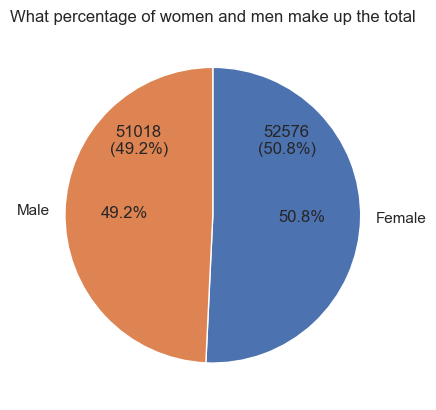

In [35]:
ax = df["Gender"].value_counts()
x = ["Female","Male"]
plt.pie(ax, labels=x, autopct='%1.1f%%', startangle=90, counterclock=False)

total = sum(ax)
t = 0.5
for i, value in enumerate(ax):
    percentage = value / total * 100
    plt.annotate(f'{value}\n({percentage:.1f}%)', 
                 xy=(t, 0.5), 
                 xytext=(0, 0), 
                 textcoords='offset points',
                 ha='center', 
                 va='center')
    t*=-1
plt.title("What percentage of women and men make up the total")
plt.show()


The number of males and females is approximately the same

**Distribution of client types**

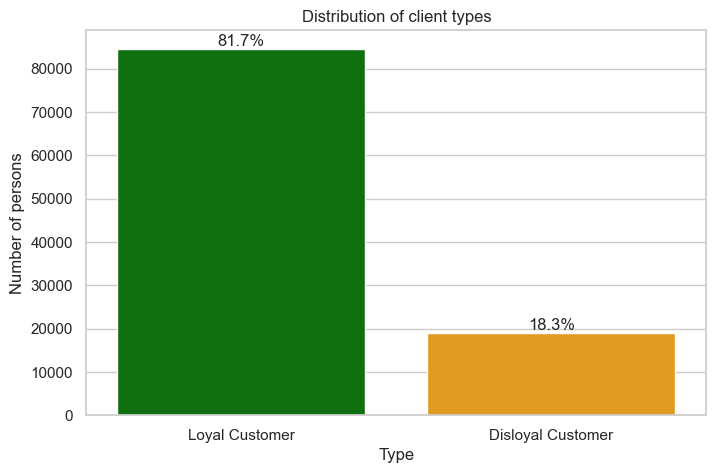

In [36]:
type_unique = df["Customer Type"].unique()
type_counts = df["Customer Type"].value_counts()
sorted_data = type_counts.reindex(type_unique)
total = sum(type_counts)
percentages = [count / total * 100 for count in type_counts]

plt.figure(figsize=(8, 5))
bars = sns.barplot(x = sorted_data.index, y = sorted_data,hue=sorted_data.index, palette=["green", "orange"], dodge=False)

plt.xlabel("Type")
plt.ylabel("Number of persons")
plt.title("Distribution of client types")

for bar, percentage in zip(bars.patches, percentages):
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, f"{percentage:.1f}%", ha="center", va="bottom")
    
plt.show()

The amount of loyal customers four and half time greater then disloyal customers

***Age Distribution***

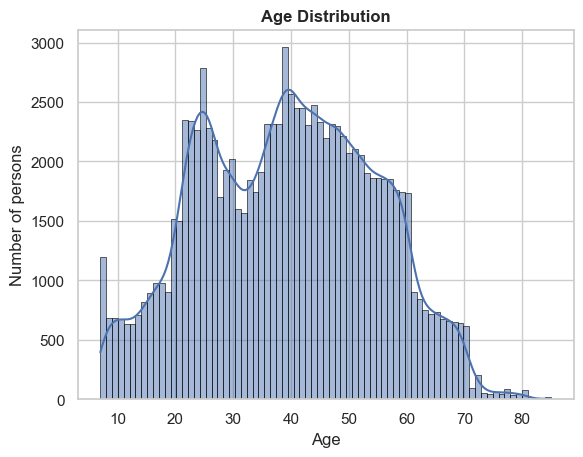

In [37]:
sns.histplot(df, x="Age", kde=True, edgecolor="black")
plt.title("Age Distribution", weight="bold")
plt.xlabel('Age')
plt.ylabel('Number of persons')
plt.show()

Most often the services are used by people aged approximately 38

***Histogram of Flight Distance***

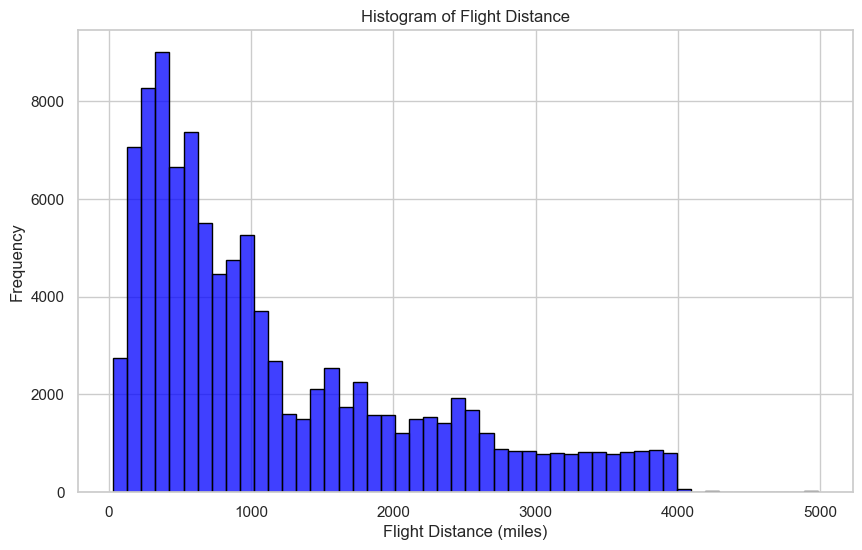

In [38]:
sns.set(style="whitegrid")

plt.figure(figsize=(10, 6))
sns.histplot(df["Flight Distance"], bins=50, kde=False, color='blue', edgecolor='black')

plt.xlabel("Flight Distance (miles)")
plt.ylabel("Frequency")
plt.title("Histogram of Flight Distance")

plt.show()

***Distribution of travel types***

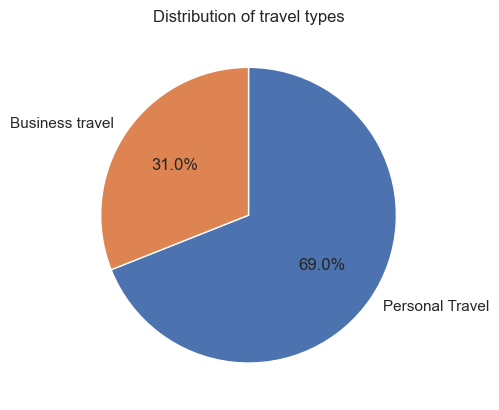

In [39]:
unique_types = df["Type of Travel"].unique()
count_types = df["Type of Travel"].value_counts()
plt.pie(count_types, labels=unique_types, autopct='%1.1f%%', startangle=90, counterclock=False)
plt.title("Distribution of travel types")
plt.show()

***Distribution of class types***

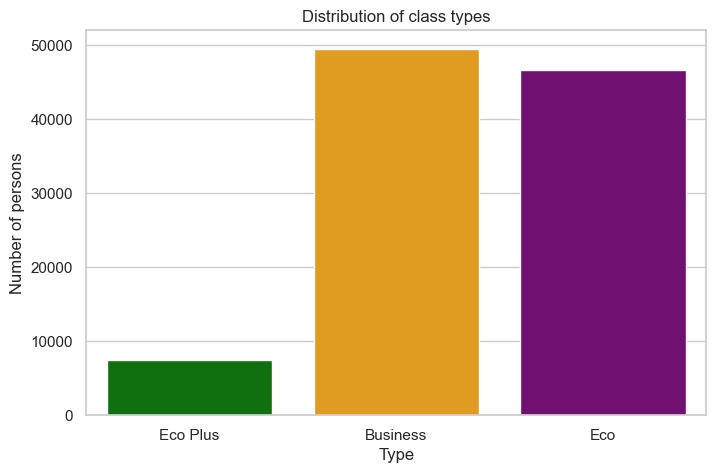

In [40]:
unique_types = df["Class"].unique()
count_types = df["Class"].value_counts()
sorted_data = count_types.reindex(unique_types)
total = sum(count_types)
percentages = [count / total * 100 for count in count_types]
plt.figure(figsize=(8, 5))
ax = sns.barplot(x=sorted_data.index, y=sorted_data, hue=sorted_data.index, palette=["green", "orange", "purple"], legend=False)
plt.xlabel("Type")
plt.ylabel("Number of persons")
plt.title("Distribution of class types")
plt.show()


***Satisfaction and Gender Distribution***

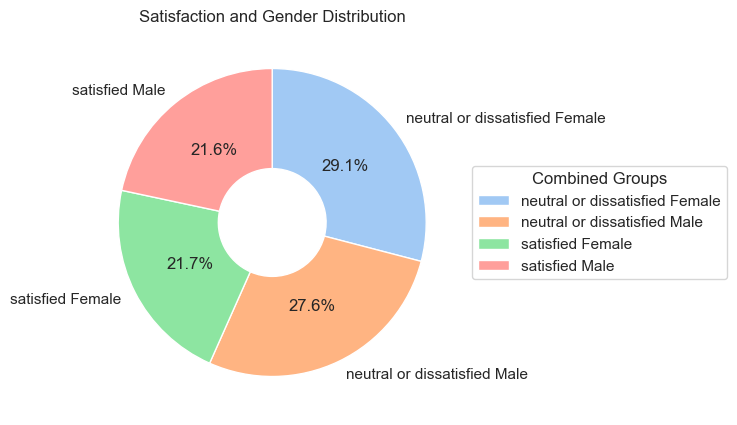

In [41]:
df['Combined'] = df['satisfaction'] + ' ' + df['Gender']
combined_counts = df['Combined'].value_counts()
colors = sns.color_palette('pastel')[0:len(combined_counts)]
plt.figure(figsize=(8, 5))
plt.pie(combined_counts, labels=combined_counts.index, autopct='%1.1f%%',
        startangle=90, counterclock=False, colors=colors, wedgeprops=dict(width=0.65))
plt.title('Satisfaction and Gender Distribution')
plt.legend(combined_counts.index, title='Combined Groups', loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


***Correlation between Flight Distance and Arrival Delay***

In [42]:
fig = px.scatter(
    df,
    x="Flight Distance",
    y="Arrival Delay in Minutes",
    marginal_x="histogram",
    marginal_y="histogram",
    title="<b>Correlation between Flight Distance and Arrival Delay",
    color_discrete_sequence=px.colors.qualitative.Antique
)
fig.show()

There is no relationship between flight distance and arrival delay.

***Age Distribution by Satisfaction***

In [43]:
fig = px.histogram(df, x="Age", color="satisfaction",
                   color_discrete_sequence=px.colors.qualitative.Antique)

fig.update_layout(
    title="<b>Age Distribution by Satisfaction</b>",
    barmode="overlay"
)
fig.update_traces(opacity=0.6) 


fig.show()

In [44]:
df.groupby("satisfaction")["Age"].mean().to_frame()

,Age
satisfaction,
neutral or dissatisfied,37.569126
satisfied,41.748558


***Flight Distance Dist. by Type of Travel***

In [45]:
fig = px.violin(data_frame=df, y="Flight Distance", color="Type of Travel", 
                color_discrete_sequence=px.colors.qualitative.Antique,
                title="<b>Flight Distance Dist. by Type of Travel")

fig.show()

**Arrival Delay Vs. Departure Delay by (satisfaction)**

In [46]:
fig = px.scatter(df, x="Arrival Delay in Minutes", y="Departure Delay in Minutes", color="satisfaction",
                 color_discrete_sequence=px.colors.qualitative.Antique)

fig.update_layout(
    title="<b>Relationship between Arrival Delay and Departure Delay",
    xaxis_title="Arrival Delay (Minutes)",
    yaxis_title="Departure Delay (Minutes)",
)

fig.show()

In [47]:
corr_satisfied = df[df["satisfaction"] == "satisfied"][["Arrival Delay in Minutes","Departure Delay in Minutes"]].corr().iloc[0,1]
corr_disatisfied = df[df["satisfaction"] == "neutral or dissatisfied"][["Arrival Delay in Minutes","Departure Delay in Minutes"]].corr().iloc[0,1]
print(f"The correlation between arrival delay and departure when satisfied = {corr_satisfied}")
print(f"The correlation between arrival delay and departure when dissatisfied = {corr_disatisfied}")

The correlation between arrival delay and departure when satisfied = 0.9655726716210811
The correlation between arrival delay and departure when dissatisfied = 0.9653090649355603


***Lets introduce new columns called "Total score", maximun value is 70.***

In [48]:
df["Total score"] = df[["Inflight wifi service","Departure/Arrival time convenient","Ease of Online booking","Gate location","Food and drink","Online boarding","Seat comfort","Inflight entertainment","On-board service","Leg room service","Baggage handling","Inflight service","Cleanliness","Checkin service"]].sum(axis=1)